In [24]:
import tensorflow as tf
import pandas as pd
import numpy as np
from surrogate import rules

from utils.df_loader import load_adult_df, load_compas_df, load_german_df, load_diabetes_df, load_breast_cancer_df
from utils.preprocessing import preprocess_df
from sklearn.model_selection import train_test_split
from utils.dice import generate_dice_result, process_results
from utils.models import train_three_models, evaluation_test, save_three_models, load_three_models
from utils.save import save_result_as_csv
from IPython.display import Image
import PIL
import pydotplus
from six import StringIO
from sklearn.tree import export_graphviz
from pydotplus import *


pd.options.mode.chained_assignment = None 

print('TF version: ', tf.__version__)
print('Eager execution enabled: ', tf.executing_eagerly()) # False

seed = 123
tf.random.set_seed(seed)
np.random.seed(seed)


TF version:  2.0.0
Eager execution enabled:  True


In [25]:
def get_location(scaler, col):
    if col in scaler.feature_names_in_:
        return np.where(scaler.feature_names_in_ == col)[0]
    
    else:
        raise Exception(f"Column [{col}] not a feature in this scaler, scaler features: {scaler.feature_names_in_}")


def get_scaled_value(scaler, col, X):
    loc=get_location(scaler, col)

    X *= scaler.scale_[loc]
    X += scaler.min_[loc]

    if scaler.clip:
        np.clip(X, scaler.feature_range[0][loc], scaler.feature_range[1][loc], out=X)
    
    return X[0]


def get_original_value(scaler, col, X):
    loc = get_location(scaler, col)

    X -= scaler.min_[loc]
    X /= scaler.scale_[loc]

    return X[0]

In [26]:
#### Select dataset ####'

dataset_name = 'compas' # [adult, german, compas]

if dataset_name == 'adult':
    dataset_loading_fn = load_adult_df
elif dataset_name == 'german':
    dataset_loading_fn = load_german_df
elif dataset_name == 'compas':
    dataset_loading_fn = load_compas_df
elif dataset_name == 'diabetes':
    dataset_loading_fn = load_diabetes_df
elif dataset_name == 'breast_cancer':
    dataset_loading_fn = load_breast_cancer_df
else:
    raise Exception("Unsupported dataset")

In [27]:
#### Load datafram info.
df_info = preprocess_df(dataset_loading_fn)
### Seperate to train and test set.
train_df, test_df = train_test_split(df_info.dummy_df, train_size=.8, random_state=seed, shuffle=True)
### Get training and testing array.
X_train = np.array(train_df[df_info.ohe_feature_names])
y_train = np.array(train_df[df_info.target_name])
X_test = np.array(test_df[df_info.ohe_feature_names])
y_test = np.array(test_df[df_info.target_name])
### Load models.
models = load_three_models(X_train.shape[-1], dataset_name)

/Users/yu-liangchou/opt/anaconda3/envs/cf_2022_final/lib/python3.7/site-packages/sklearn/base.py:338: UserWarning: Trying to unpickle estimator DecisionTreeClassifier from version 0.24.2 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  UserWarning,
/Users/yu-liangchou/opt/anaconda3/envs/cf_2022_final/lib/python3.7/site-packages/sklearn/base.py:338: UserWarning: Trying to unpickle estimator RandomForestClassifier from version 0.24.2 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  UserWarning,


In [28]:
df_info

DfInfo(df=      age          age_cat     sex              race  priors_count  \
0      69  Greater than 45    Male             Other             0   
1      34          25 - 45    Male  African-American             0   
2      24     Less than 25    Male  African-American             4   
3      23     Less than 25    Male  African-American             1   
4      43          25 - 45    Male             Other             2   
...   ...              ...     ...               ...           ...   
7209   23     Less than 25    Male  African-American             0   
7210   23     Less than 25    Male  African-American             0   
7211   57  Greater than 45    Male             Other             0   
7212   33          25 - 45  Female  African-American             3   
7213   23     Less than 25  Female          Hispanic             2   

      days_b_screening_arrest c_charge_degree  is_recid  is_violent_recid  \
0                           1               F         0                 

In [29]:
#pip install pillow
#pip install dtreeviz
#pip install Graphviz
from dtreeviz.trees import *
from sklearn.tree import DecisionTreeClassifier
dice_dt = pd.read_csv(r'./datasets/eval_dice_compas_dt_result.csv')


In [31]:
feature_names=df_info.ohe_feature_names
totoal_ohe_feature_names = len(feature_names)
totoal_ohe_feature_names

20

In [12]:
test1 = dice_dt.nsmallest(1,['L2'])
test1

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,scaled_input_age,scaled_input_age_cat,scaled_input_sex,scaled_input_race,scaled_input_priors_count,scaled_input_days_b_screening_arrest,scaled_input_c_charge_degree,...,running_time,Found,ground_truth,prediction,L1,L2,Sparsity,Realistic,MAD,Mahalanobis
4,4.0,0.0,0.0,0.128205,25 - 45,Female,Other,0.026316,0.0,F,...,0.078789,Y,Medium-Low,Medium-Low,0.0,0.0,0.0,True,0.0,0.0


In [13]:
test = dice_dt.nlargest(1,['L2'])
test

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,scaled_input_age,scaled_input_age_cat,scaled_input_sex,scaled_input_race,scaled_input_priors_count,scaled_input_days_b_screening_arrest,scaled_input_c_charge_degree,...,running_time,Found,ground_truth,prediction,L1,L2,Sparsity,Realistic,MAD,Mahalanobis
26,26.0,5.0,0.0,0.076923,Less than 25,Male,African-American,0.052632,1.0,M,...,0.078756,Y,Medium-Low,High,4.0,2.0,4.0,True,0.307692,1.206921


In [14]:

# VISUALISE_DECISION_TREE_PATH
# 
def visualize_decision_tree_path( clf, graph, instance, indx, exp_type, path ):  

  for i, node in enumerate(graph.get_node_list()):
    if node.get_attributes().get('label') is None:
        continue

    if 'samples = ' in node.get_attributes()['label']:
        labels = node.get_attributes()['label'].split('<br/>')
        for i, label in enumerate(labels):
            if label.startswith('samples = '):
                labels[i] = 'samples = 0'
        node.set('label', '<br/>'.join(labels))
        node.set_fillcolor('white')
    
    lable_str = node.get_attributes()['label']  
    feature_value_str = (lable_str.split("<br/>")[0]).replace('<','')
    feature_name = feature_value_str.split(" ")[0]
    if feature_name in df_info.scaler.feature_names_in_:
      feature_value = float(feature_value_str.split(" ")[-1])
      original_value = get_original_value(df_info.scaler, feature_name , feature_value)
      #print(f"name: {feature_name}. value: {feature_value}, original_value: {original_value}")
      original_lable_str = lable_str.replace(feature_value_str, ' '.join([*(feature_value_str.split(' '))[:-1],f'{original_value:.2f}']))
      node.set('label', original_lable_str)
    #raise StopIteration()

  samples = instance
  
  decision_paths = clf.decision_path( [samples] )

  for decision_path in decision_paths:
    for n, node_value in enumerate(decision_path.toarray()[0]):
      if node_value == 0:
        continue
      node = graph.get_node(str(n))[0]            
      node.set_fillcolor('green')
      labels = node.get_attributes()['label'].split('<br/>')
      for i, label in enumerate(labels):
        if label.startswith('samples = '):
          labels[i] = 'samples = {}'.format(int(label.split('=')[1]) + 1)
      
      node.set('label', '<br/>'.join(labels))

  filename = path
  graph.write_png(filename)

  im = PIL.Image.open(filename)
  return im


# EXTRACT_DECISION_PATH
# 
def extract_decision_path(clf, graph, instance ):

  #samples = instance['scaled_vector']
  #decision_paths = clf.decision_path( [samples] )
  samples = instance
  decision_paths = clf.decision_path( [samples] )

  for decision_path in decision_paths:
    path = []
    for n, node_value in enumerate(decision_path.toarray()[0]):
      if node_value == 0:
        continue

      node = graph.get_node(str(n))[0]
      labels = node.get_attributes()['label'].split('<br/>')
      labels.pop(1)
      try:
        labels.remove("samples = 1")
        labels.remove("samples = 0")
        labels.remove("gini = 0.0")
      except ValueError:
        labels
      path.append(labels)
  return path

def export_decision_tree(clf, class_names, DATASET_NAME, path):
  dot_data = StringIO()
  export_graphviz(clf, out_file=dot_data,  
                  filled=True, rounded=True,
                  special_characters=True, feature_names = feature_names,
                  class_names=class_names)

  # convert to png format
  graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
  graph.write_png(path)
  return graph


In [15]:
#### import evaluation function.
from utils.evaluation import prepare_evaluation_dict
input_and_cf = prepare_evaluation_dict(dice_dt, df_info)


clf=models['dt']
#clf = DecisionTreeClassifier()
class_names = ["No", "Yes"]



In [16]:
#filepath = PATH + 'Whitebox_Model/explanations/' + DATASET_NAME.replace(".csv", "")+ '/Decision_Tree/' + exp_type + '/decision_tree_general_' + str(INDX) + '.png'
PATH = "GitHub/Counterfactual-benchmark/"
dataset_name = 'compas' # [adult, german, compas]
filepath = "/Users/yu-liangchou/Desktop/cf_experiment/tree.png"
#feature_names=df_info.feature_names
feature_names=df_info.ohe_feature_names
graph = export_decision_tree(clf, class_names, dataset_name, filepath) 



#Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.43729 to fit



In [17]:
PATH

'GitHub/Counterfactual-benchmark/'

In [18]:
df_info.feature_names

['age',
 'age_cat',
 'sex',
 'race',
 'priors_count',
 'days_b_screening_arrest',
 'c_charge_degree',
 'is_recid',
 'is_violent_recid',
 'two_year_recid',
 'length_of_stay']

In [19]:
df_info

DfInfo(df=      age          age_cat     sex              race  priors_count  \
0      69  Greater than 45    Male             Other             0   
1      34          25 - 45    Male  African-American             0   
2      24     Less than 25    Male  African-American             4   
3      23     Less than 25    Male  African-American             1   
4      43          25 - 45    Male             Other             2   
...   ...              ...     ...               ...           ...   
7209   23     Less than 25    Male  African-American             0   
7210   23     Less than 25    Male  African-American             0   
7211   57  Greater than 45    Male             Other             0   
7212   33          25 - 45  Female  African-American             3   
7213   23     Less than 25  Female          Hispanic             2   

      days_b_screening_arrest c_charge_degree  is_recid  is_violent_recid  \
0                           1               F         0                 

In [20]:
df_info.ohe_feature_names

['age',
 'priors_count',
 'days_b_screening_arrest',
 'is_recid',
 'is_violent_recid',
 'two_year_recid',
 'length_of_stay',
 'age_cat_25 - 45',
 'age_cat_Greater than 45',
 'age_cat_Less than 25',
 'sex_Female',
 'sex_Male',
 'race_African-American',
 'race_Asian',
 'race_Caucasian',
 'race_Hispanic',
 'race_Native American',
 'race_Other',
 'c_charge_degree_F',
 'c_charge_degree_M']

In [21]:
feature_names=df_info.ohe_feature_names

In [22]:
feature_names

['age',
 'priors_count',
 'days_b_screening_arrest',
 'is_recid',
 'is_violent_recid',
 'two_year_recid',
 'length_of_stay',
 'age_cat_25 - 45',
 'age_cat_Greater than 45',
 'age_cat_Less than 25',
 'sex_Female',
 'sex_Male',
 'race_African-American',
 'race_Asian',
 'race_Caucasian',
 'race_Hispanic',
 'race_Native American',
 'race_Other',
 'c_charge_degree_F',
 'c_charge_degree_M']

[Text(0.625189947702018, 0.9833333333333333, 'node #0\npriors_count <= 0.118\ngini = 0.407\nsamples = 5771\nvalue = [1643, 4128]'),
 Text(0.37316105733634997, 0.95, 'node #1\nage <= 0.071\ngini = 0.307\nsamples = 4288\nvalue = [813, 3475]'),
 Text(0.17750808050243783, 0.9166666666666666, 'node #2\npriors_count <= 0.039\ngini = 0.487\nsamples = 910\nvalue = [383, 527]'),
 Text(0.12428194148720602, 0.8833333333333333, 'node #3\nlength_of_stay <= 1.5\ngini = 0.453\nsamples = 679\nvalue = [235, 444]'),
 Text(0.07426677806319675, 0.85, 'node #4\nrace_African-American <= 0.5\ngini = 0.412\nsamples = 445\nvalue = [129, 316]'),
 Text(0.04987904331994912, 0.8166666666666667, 'node #5\ndays_b_screening_arrest <= 24.0\ngini = 0.319\nsamples = 186\nvalue = [37, 149]'),
 Text(0.043494525774995636, 0.7833333333333333, 'node #6\nis_violent_recid <= 0.5\ngini = 0.296\nsamples = 177\nvalue = [32, 145]'),
 Text(0.035513878843803776, 0.75, 'node #7\ndays_b_screening_arrest <= 1.5\ngini = 0.28\nsamples = 

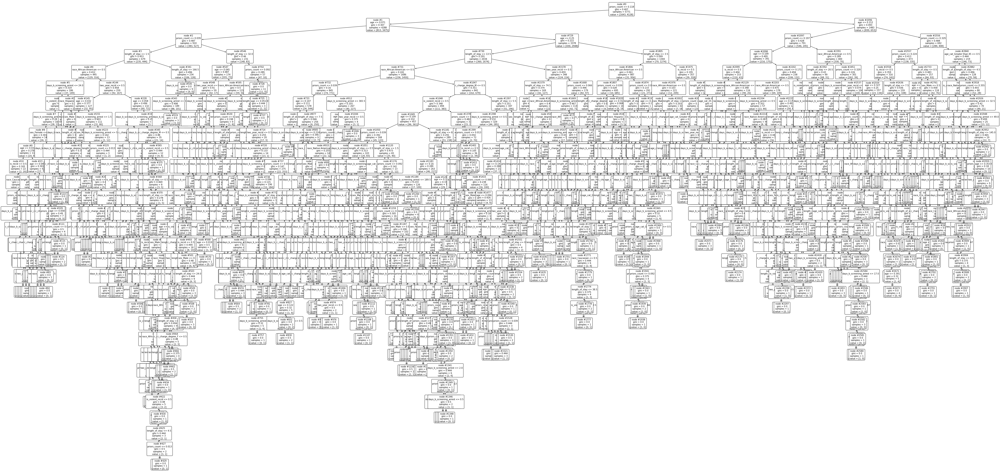

In [23]:
#### Plot the dt tree.
from sklearn import tree
import matplotlib.pyplot as plt
plt.figure(figsize=(80,40))
tree.plot_tree(models['dt'], fontsize=10, feature_names=df_info.ohe_feature_names, node_ids=True,rounded=True )
#If you need to colored the class >> filled=True


In [13]:
#### retrieve the input and cf vectors.
dice_input = input_and_cf['input'].loc[26]
dice_cf = input_and_cf['cf'].loc[26]





In [14]:
#### Present the decision path
tree_path = extract_decision_path(clf, graph, dice_input)
tree_path

[['<priors_count &le; 0.118',
  'samples = 5771',
  'value = [1643, 4128]',
  'class = Yes>'],
 ['<age &le; 0.071', 'samples = 4288', 'value = [813, 3475]', 'class = Yes>'],
 ['<age &le; 0.25', 'samples = 3378', 'value = [430, 2948]', 'class = Yes>'],
 ['<length_of_stay &le; 13.5',
  'samples = 2034',
  'value = [360, 1674]',
  'class = Yes>'],
 ['<race_African-American &le; 0.5',
  'samples = 1686',
  'value = [236, 1450]',
  'class = Yes>'],
 ['<c_charge_degree_M &le; 0.5',
  'samples = 841',
  'value = [162, 679]',
  'class = Yes>'],
 ['<length_of_stay &le; 5.5',
  'samples = 347',
  'value = [51, 296]',
  'class = Yes>'],
 ['<days_b_screening_arrest &le; 0.5',
  'samples = 329',
  'value = [44, 285]',
  'class = Yes>'],
 ['<length_of_stay &le; 1.5',
  'samples = 257',
  'value = [42, 215]',
  'class = Yes>'],
 ['<age_cat_Less than 25 &le; 0.5',
  'samples = 41',
  'value = [3, 38]',
  'class = Yes>'],
 ['<length_of_stay &le; 2.5', 'samples = 6', 'value = [2, 4]', 'class = Yes>'],
 

In [15]:
decisions, pred, leaf_id = rules.get_decision_process(np.array(dice_input).reshape(1, -1), models['dt'], df_info.ohe_feature_names)
print(leaf_id)


decision node 0 : (x [priors_count] = 0.052631579) <= 0.1184210553765297)
decision node 1 : (x [age] = 0.07692308) > 0.07051282376050949)
decision node 729 : (x [age] = 0.07692308) <= 0.2500000074505806)
decision node 730 : (x [length_of_stay] = 3.0) <= 13.5)
decision node 731 : (x [race_African-American] = 1.0) > 0.5)
decision node 1047 : (x [c_charge_degree_M] = 1.0) > 0.5)
decision node 1397 : (x [length_of_stay] = 3.0) <= 5.5)
decision node 1398 : (x [days_b_screening_arrest] = 1.0) > 0.5)
decision node 1412 : (x [length_of_stay] = 3.0) > 1.5)
decision node 1560 : (x [age_cat_Less than 25] = 1.0) > 0.5)
decision node 1566 : (x [length_of_stay] = 3.0) > 2.5)
1572


In [122]:
decisions, pred, leaf_id = rules.get_decision_process(np.array(dice_cf).reshape(1, -1), models['dt'], df_info.ohe_feature_names)
print(leaf_id)

decision node 0 : (x [priors_count] = 0.052631579) <= 0.1184210553765297)
decision node 1 : (x [age] = 0.07692308) > 0.07051282376050949)
decision node 729 : (x [age] = 0.07692308) <= 0.2500000074505806)
decision node 730 : (x [length_of_stay] = 3.0) <= 13.5)
decision node 731 : (x [race_African-American] = 1.0) > 0.5)
decision node 1047 : (x [c_charge_degree_M] = 0.0) <= 0.5)
decision node 1048 : (x [is_violent_recid] = 0.0) <= 0.5)
decision node 1049 : (x [age] = 0.07692308) <= 0.10897435992956161)
decision node 1050 : (x [priors_count] = 0.052631579) > 0.03947368450462818)
decision node 1120 : (x [length_of_stay] = 3.0) > 1.5)
decision node 1176 : (x [priors_count] = 0.052631579) <= 0.09210526198148727)
1177


In [123]:
INDX = 4
exp_type = "true_positives"
#instance = new_min_l2_instance_instance_arr

img = visualize_decision_tree_path( clf, export_decision_tree(clf, class_names, dataset_name, filepath), dice_input, INDX, 'true_positives', filepath)
img



dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.43729 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.425076 to fit



In [124]:
#exp_type = "L2_max"
INDX = 4
#instance = instance
#exp_type = "true_positives"
#instance = new_min_l2_instance_instance_arr

img = visualize_decision_tree_path( clf,  export_decision_tree(clf, class_names, dataset_name, filepath), dice_cf, INDX, 'true_positives', filepath)
img

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.43729 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.425076 to fit

